# Data Understanding
This notebook use diamonds dataset in order to demonstrate and exercise common data understanding tasks.
The notbook includes:
* [Diamonds dataset description](#dataset_description)
* [Data loading and metadata extraction](#data_loading)
* [Basic descriptive statistics](#basic_descriptive_statistics)
* [Statistical measures](#statistical_measures)
    * [Entropy](#entropy)
    * [Mutual Information](#mutual_information)
    * [Correlation](#correlation)
* [Data visualization](#data_visualization)

---

In [2]:
from IPython.display import HTML
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy as sc
from sklearn.decomposition import PCA
#  from sklearn.datasets import load_iris
from sklearn import metrics

## <a name="dataset_description"></a>Diamonds Dataset Description:

Each row represent a diamond. It's properties, and it's price.
In most cases we try to build a supervised learning algorithm in order to assess a diamond price based on it's properties.

A diamond is described by the following properties:
* carat -Carat weight of the diamond
* cut - Describe cut quality of the diamond. Quality in increasing order Fair, Good, Very Good, Premium, Ideal
* color - Color of the diamond, with D being the best and J the worst
* clarity - How obvious inclusions are within the diamond:(in order from best to worst, FL = flawless, I3= level 3 inclusions) FL,IF, VVS1, VVS2, VS1, VS2, SI1, SI2, I1, I2, I3
* depth - depth % :The height of a diamond, measured from the culet to the table, divided by its average girdle diameter
* table - table%: The width of the diamond's table expressed as a percentage of its average diameter
* price - The price of the diamond
* x - Length mm
* y - Width mm
* z - Depth mm

## <a name="data_loading"></a>Data Loading

Read csv file into pandas dataframe. present few rows with the "head" function.

In [3]:
voters = pd.read_csv('../../../OneDrive - Technion/Technion/Semester G/Intro to Machine Learning/Introduction_to_Machine_Learning_236756/HW_2/ElectionsData.csv')
voters.head(15)

,Vote,Occupation_Satisfaction,Avg_monthly_expense_when_under_age_21,AVG_lottary_expanses,Most_Important_Issue,Avg_monthly_expense_on_pets_or_plants,Looking_at_poles_results,Avg_environmental_importance,Married,Gender,...,Last_school_grades,Age_group,Number_of_differnt_parties_voted_for,Political_interest_Total_Score,Number_of_valued_Kneset_members,Main_transportation,Occupation,Avg_education_importance,Num_of_kids_born_last_10_years,Financial_agenda_matters
0,Khakis,4.0,98.179190,9405.478590,Healthcare,32.726397,Yes,287.397316,Yes,Male,...,80.0,30-45,3.0,458.769092,10.0,Car,Hightech,304.669704,0.0,Yes
1,Oranges,5.0,514.970665,61270.417540,Military,171.656888,No,356.935385,Yes,Male,...,30.0,Below_30,2.0,672.592678,6.0,Public_or_other,Industry_or_other,392.702317,2.0,No
2,Purples,5.0,75.743802,9086.370209,Healthcare,25.247934,Yes,359.885691,Yes,Female,...,80.0,30-45,0.0,646.913254,12.0,Foot_or_bicycle,Hightech,464.337160,NaN,No
3,Turquoises,4.0,266.509671,4703.108703,Healthcare,88.836557,Yes,52.941141,Yes,Male,...,80.0,Below_30,2.0,23.742677,11.0,Foot_or_bicycle,Public_Sector,26.258248,0.0,Yes
4,Yellows,10.0,1079.479714,95476.465950,Social,359.826571,No,265.340232,Yes,Female,...,70.0,45_and_up,1.0,537.136752,10.0,Foot_or_bicycle,Student_or_Unemployed,387.592828,2.0,No
5,Khakis,8.0,580.638566,9634.095730,Environment,193.546188,Yes,49.776727,Yes,Male,...,NaN,30-45,1.0,570.501795,14.0,Public_or_other,Services_or_Retail,328.393265,0.0,No
6,Blues,5.0,1158.972626,76439.712120,Education,386.324209,No,197.864152,Yes,Male,...,100.0,Below_30,3.0,457.698366,14.0,Public_or_other,Hightech,229.621861,1.0,Yes
7,Khakis,1.0,269.442675,16335.483200,Education,89.814225,Yes,181.880801,Yes,Female,...,100.0,45_and_up,2.0,271.574086,12.0,Car,Public_Sector,10.055256,0.0,No
8,Whites,10.0,565.572572,53625.303010,Education,188.524191,No,284.447862,Yes,Female,...,100.0,30-45,3.0,562.271817,10.0,Foot_or_bicycle,Industry_or_other,530.876461,0.0,No
9,Khakis,8.0,985.856240,49312.786470,Environment,328.618747,No,150.060783,Yes,Male,...,90.0,30-45,2.0,585.553386,14.0,Foot_or_bicycle,Student_or_Unemployed,305.829775,0.0,Yes


Diamonds info will describe each field and the general pandas object that we use.

In [6]:
voters.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 38 columns):
Vote                                             10000 non-null object
Occupation_Satisfaction                          9807 non-null float64
Avg_monthly_expense_when_under_age_21            9804 non-null float64
AVG_lottary_expanses                             9808 non-null float64
Most_Important_Issue                             9906 non-null object
Avg_monthly_expense_on_pets_or_plants            9799 non-null float64
Looking_at_poles_results                         9907 non-null object
Avg_environmental_importance                     9825 non-null float64
Married                                          9915 non-null object
Gender                                           9932 non-null object
Voting_Time                                      9909 non-null object
Financial_balance_score_(0-1)                    9814 non-null float64
%Of_Household_Income                         

Describing the type of each field

In [7]:
print("List of voters features: {}".format(voters.columns.values))
print()
print(voters.dtypes)

List of voters features: ['Vote' 'Occupation_Satisfaction' 'Avg_monthly_expense_when_under_age_21'
 'AVG_lottary_expanses' 'Most_Important_Issue'
 'Avg_monthly_expense_on_pets_or_plants' 'Looking_at_poles_results'
 'Avg_environmental_importance' 'Married' 'Gender' 'Voting_Time'
 'Financial_balance_score_(0-1)' '%Of_Household_Income' 'Yearly_IncomeK'
 'Overall_happiness_score' 'Garden_sqr_meter_per_person_in_residancy_area'
 'Avg_Residancy_Altitude' 'Yearly_ExpensesK' '%Time_invested_in_work'
 'Avg_government_satisfaction' 'Avg_Satisfaction_with_previous_vote'
 'Avg_monthly_household_cost' 'Will_vote_only_large_party'
 'Phone_minutes_10_years' 'Avg_size_per_room' 'Weighted_education_rank'
 '%_satisfaction_financial_policy' 'Avg_monthly_income_all_years'
 'Last_school_grades' 'Age_group' 'Number_of_differnt_parties_voted_for'
 'Political_interest_Total_Score' 'Number_of_valued_Kneset_members'
 'Main_transportation' 'Occupation' 'Avg_education_importance'
 'Num_of_kids_born_last_10_years'

Finding the "shape" of our dataset. Shape of a dataframe describe the number of rows and columns of a given dataframe.

In [8]:
print("dataset has",voters.shape[0],"rows and",voters.shape[1],"columns")
diamonds.shape

dataset has 10000 rows and 38 columns


(10000, 38)

## <a name="basic_descriptive_statistics"></a>Basic Descriptive Statistics

The "describe" function will give us common numeric distribution metrics on each numeric column

In [9]:
voters.describe()

,Occupation_Satisfaction,Avg_monthly_expense_when_under_age_21,AVG_lottary_expanses,Avg_monthly_expense_on_pets_or_plants,Avg_environmental_importance,Financial_balance_score_(0-1),%Of_Household_Income,Yearly_IncomeK,Overall_happiness_score,Garden_sqr_meter_per_person_in_residancy_area,...,Avg_size_per_room,Weighted_education_rank,%_satisfaction_financial_policy,Avg_monthly_income_all_years,Last_school_grades,Number_of_differnt_parties_voted_for,Political_interest_Total_Score,Number_of_valued_Kneset_members,Avg_education_importance,Num_of_kids_born_last_10_years
count,9807.000000,9804.000000,9808.000000,9799.000000,9825.000000,9814.000000,9826.000000,9807.000000,9805.000000,9820.000000,...,9801.000000,9829.000000,9815.000000,9811.000000,9810.000000,9816.000000,9805.000000,9820.000000,9827.000000,9815.000000
mean,5.496380,461.133856,70174.104307,153.562802,450.826042,0.500167,0.496211,502.595342,4.984452,49.555441,...,20.797231,316.730235,50.386923,38874.883084,75.078491,2.009474,712.392434,10.785031,506.442074,0.661029
std,2.887475,370.195902,77882.132180,123.301490,236.409307,0.289429,0.287903,288.958367,2.883421,28.930516,...,5.282197,228.837689,29.018956,65978.477685,18.920262,1.266526,297.388564,2.685035,227.214023,1.035307
min,1.000000,-896.270773,-160017.623900,-298.756925,0.059519,0.000102,0.000042,0.038637,0.001976,0.008610,...,0.083022,14.551630,0.012271,9.752851,30.000000,0.000000,1.145963,5.000000,0.011926,0.000000
25%,3.000000,192.759596,21217.675070,64.313790,305.722603,0.247900,0.250226,252.668644,2.503905,24.499663,...,19.234548,135.782963,25.170656,4346.395158,60.000000,1.000000,586.135544,9.000000,412.912752,0.000000
50%,6.000000,367.485498,48399.689340,122.355526,422.066822,0.503044,0.493134,501.823366,4.983767,49.028715,...,20.929220,241.629721,50.932061,15163.174020,80.000000,2.000000,684.228253,11.000000,497.574885,0.000000
75%,8.000000,650.746959,91307.113393,216.671510,545.237522,0.749393,0.742453,755.028305,7.466872,74.571093,...,22.861862,496.332391,75.520378,47139.044135,90.000000,3.000000,812.186367,13.000000,616.102851,1.000000
max,10.000000,2302.613917,739719.934800,767.537972,999.926342,0.999960,0.999908,999.982718,9.997729,99.993232,...,31.617583,865.252269,99.992552,589892.076700,100.000000,7.000000,1498.855884,16.000000,999.992377,10.000000


"value_counts" will give us the distribution of a given categorical column

In [8]:
cat_columns = voters.select_dtypes(include='object').columns
print(cat_columns)
for curr_column in cat_columns:
    voters.fillna("None")
    voters[curr_column+"_cat"] = voters[curr_column].astype('category')
    voters[curr_column+"_cat"] =  voters[curr_column+"_cat"].cat.codes
    print("{} column distribution:".format(curr_column))
    print(voters[curr_column].value_counts())
    print()

Index(['Looking_at_poles_results', 'Married', 'Gender', 'Voting_Time',
       'Will_vote_only_large_party', 'Age_group', 'Main_transportation',
       'Occupation', 'Financial_agenda_matters'],
      dtype='object')


ValueError: fill value must be in categories

Detecting how many "null" we have in each column

In [11]:
voters.isna().sum()

Vote                                               0
Occupation_Satisfaction                          193
Avg_monthly_expense_when_under_age_21            196
AVG_lottary_expanses                             192
Most_Important_Issue                              94
Avg_monthly_expense_on_pets_or_plants            201
Looking_at_poles_results                          93
Avg_environmental_importance                     175
Married                                           85
Gender                                            68
Voting_Time                                       91
Financial_balance_score_(0-1)                    186
%Of_Household_Income                             174
Yearly_IncomeK                                   193
Overall_happiness_score                          195
Garden_sqr_meter_per_person_in_residancy_area    180
Avg_Residancy_Altitude                           185
Yearly_ExpensesK                                 180
%Time_invested_in_work                        

#TODO: Check how much data is left if we delete all rows with null

In [10]:
# diamonds = diamonds.drop(diamonds.loc[diamonds.x <= 0].index)
# diamonds = diamonds.drop(diamonds.loc[diamonds.y <= 0].index)
# diamonds = diamonds.drop(diamonds.loc[diamonds.z <= 0].index)
# print("removed!")

removed!


Let's check again weather we have records with 0 value in one of their axis (x\y\z)

In [11]:
# print(len(diamonds[(diamonds.x == 0) | (diamonds.y == 0) | (diamonds.z == 0)]))

0


## <a name="statistical_measures"></a>Statistical Measures


### <a name="entropy"></a>Entropy

Entropy calculation for a categorical column, require computing probabilities first

In [24]:
for object_type_data in voters.select_dtypes(include='object'):
    p_data= voters[object_type_data].value_counts()/len(voters) # calculates the probabilities
    print(p_data)
    entropy=sc.stats.entropy(p_data)  # input probabilities to get the entropy 
    print(entropy)
    print()

Purples       0.2497
Khakis        0.2004
Browns        0.0939
Turquoises    0.0551
Blues         0.0540
Greens        0.0539
Reds          0.0502
Whites        0.0485
Greys         0.0443
Violets       0.0421
Yellows       0.0410
Oranges       0.0345
Pinks         0.0324
Name: Vote, dtype: float64
2.292083739900458

Social             0.1768
Education          0.1750
Healthcare         0.1735
Environment        0.1735
Financial          0.1644
Foreign_Affairs    0.0444
Other              0.0441
Military           0.0389
Name: Most_Important_Issue, dtype: float64
1.9269717614811683

Yes    0.5010
No     0.4897
Name: Looking_at_poles_results, dtype: float64
0.6930821298587081

Yes    0.6686
No     0.3229
Name: Married, dtype: float64
0.6310683752345778

Female    0.5013
Male      0.4919
Name: Gender, dtype: float64
0.6931023928586031

After_16:00    0.4964
By_16:00       0.4945
Name: Voting_Time, dtype: float64
0.6931453422538993

No       0.3360
Maybe    0.3290
Yes      0.3261
Name: Wi

Entropy calculation for a numeric column. Require discritization first

In [28]:
for num_type_data in voters.select_dtypes(include='float64'):
    disc = pd.qcut(voters[num_type_data], 5)
    print(disc)
    p_data= disc.value_counts()/len(disc) # calculates the probabilities
    entropy=sc.stats.entropy(p_data)  # input probabilities to get the entropy 
    print(entropy)

0         (2.0, 4.0]
1         (4.0, 6.6]
2         (4.0, 6.6]
3         (2.0, 4.0]
4        (9.0, 10.0]
5         (6.6, 9.0]
6         (4.0, 6.6]
7       (0.999, 2.0]
8        (9.0, 10.0]
9         (6.6, 9.0]
10        (2.0, 4.0]
11        (2.0, 4.0]
12        (2.0, 4.0]
13        (4.0, 6.6]
14        (2.0, 4.0]
15       (9.0, 10.0]
16        (4.0, 6.6]
17        (6.6, 9.0]
18      (0.999, 2.0]
19       (9.0, 10.0]
20        (6.6, 9.0]
21        (6.6, 9.0]
22        (6.6, 9.0]
23        (6.6, 9.0]
24        (2.0, 4.0]
25               NaN
26        (6.6, 9.0]
27      (0.999, 2.0]
28      (0.999, 2.0]
29      (0.999, 2.0]
            ...     
9970             NaN
9971      (6.6, 9.0]
9972      (6.6, 9.0]
9973    (0.999, 2.0]
9974      (2.0, 4.0]
9975      (6.6, 9.0]
9976      (6.6, 9.0]
9977    (0.999, 2.0]
9978      (4.0, 6.6]
9979      (4.0, 6.6]
9980    (0.999, 2.0]
9981      (2.0, 4.0]
9982      (2.0, 4.0]
9983    (0.999, 2.0]
9984      (2.0, 4.0]
9985      (2.0, 4.0]
9986      (6.

1.609437891658232
0        (81978.375, 147516.116]
1        (81978.375, 147516.116]
2        (81978.375, 147516.116]
3           (0.00254, 81978.375]
4           (0.00254, 81978.375]
5           (0.00254, 81978.375]
6           (0.00254, 81978.375]
7           (0.00254, 81978.375]
8           (0.00254, 81978.375]
9           (0.00254, 81978.375]
10       (81978.375, 147516.116]
11          (0.00254, 81978.375]
12      (214733.622, 378079.674]
13          (0.00254, 81978.375]
14                           NaN
15          (0.00254, 81978.375]
16          (0.00254, 81978.375]
17          (0.00254, 81978.375]
18          (0.00254, 81978.375]
19      (147516.116, 214733.622]
20          (0.00254, 81978.375]
21          (0.00254, 81978.375]
22      (147516.116, 214733.622]
23      (214733.622, 378079.674]
24          (0.00254, 81978.375]
25          (0.00254, 81978.375]
26      (147516.116, 214733.622]
27       (81978.375, 147516.116]
28          (0.00254, 81978.375]
29          (0.00254, 819

ValueError: Bin edges must be unique: array([0., 1., 2., 2., 3., 7.]).
You can drop duplicate edges by setting the 'duplicates' kwarg

### <a name="mutual_information"></a>Mututal infromation

Giving two variables it will compute their mautual information

In [14]:
print(metrics.mutual_info_score(diamonds["color"], diamonds["price"]))
#print(metrics.adjusted_mutual_info_score(diamonds["color"], diamonds["price"]))
#print(metrics.normalized_mutual_info_score(diamonds["color"], diamonds["price"]))

print(metrics.mutual_info_score(diamonds["x"], diamonds["price"]))
#print(metrics.adjusted_mutual_info_score(diamonds["y"], diamonds["price"]))
#print(metrics.normalized_mutual_info_score(diamonds["y"], diamonds["price"]))

0.8493282141080026
4.004678976147534


### <a name="correlation"></a>Correlation

Compute correlation matrix (will work only on numeric columns)

In [12]:
voters.corr()

,Occupation_Satisfaction,Avg_monthly_expense_when_under_age_21,AVG_lottary_expanses,Avg_monthly_expense_on_pets_or_plants,Avg_environmental_importance,Financial_balance_score_(0-1),%Of_Household_Income,Yearly_IncomeK,Overall_happiness_score,Garden_sqr_meter_per_person_in_residancy_area,...,Avg_size_per_room,Weighted_education_rank,%_satisfaction_financial_policy,Avg_monthly_income_all_years,Last_school_grades,Number_of_differnt_parties_voted_for,Political_interest_Total_Score,Number_of_valued_Kneset_members,Avg_education_importance,Num_of_kids_born_last_10_years
Occupation_Satisfaction,1.000000,0.006729,-0.000385,0.005114,-0.002432,-0.012826,-0.002737,-0.001207,-0.007465,-0.006844,...,-0.002822,0.012337,0.023336,0.001138,-0.006200,-0.016621,-0.004760,-0.003579,0.000233,0.011512
Avg_monthly_expense_when_under_age_21,0.006729,1.000000,0.768346,1.000000,0.032962,-0.006465,-0.004022,-0.002331,-0.000231,-0.002573,...,-0.003231,0.115034,-0.002940,0.915212,0.046206,-0.001462,0.018338,0.073773,0.001008,-0.007818
AVG_lottary_expanses,-0.000385,0.768346,1.000000,0.769584,0.520025,-0.002064,0.001262,-0.000084,-0.011770,0.001908,...,0.283813,0.125339,-0.009586,0.733405,0.012174,0.006270,0.355079,0.050570,0.296856,-0.006581
Avg_monthly_expense_on_pets_or_plants,0.005114,1.000000,0.769584,1.000000,0.034801,-0.006934,-0.001207,-0.001112,0.001541,-0.001364,...,-0.001988,0.115820,-0.001615,0.914615,0.043608,-0.001173,0.019383,0.072399,0.000657,-0.008923
Avg_environmental_importance,-0.002432,0.032962,0.520025,0.034801,1.000000,0.006792,0.012875,-0.000261,-0.013538,0.004160,...,0.706637,0.082456,-0.008728,0.043122,-0.059805,0.012673,0.818001,-0.019837,0.729218,-0.003615
Financial_balance_score_(0-1),-0.012826,-0.006465,-0.002064,-0.006934,0.006792,1.000000,0.020782,-0.017074,0.014653,-0.009378,...,0.013343,-0.001091,-0.003678,-0.000890,0.000758,-0.003899,0.007997,-0.006586,0.000190,-0.012820
%Of_Household_Income,-0.002737,-0.004022,0.001262,-0.001207,0.012875,0.020782,1.000000,-0.029784,0.005832,0.000365,...,0.019362,-0.016610,-0.001821,-0.010602,0.007472,-0.006789,0.015542,-0.009242,0.012965,-0.008513
Yearly_IncomeK,-0.001207,-0.002331,-0.000084,-0.001112,-0.000261,-0.017074,-0.029784,1.000000,0.003595,0.006319,...,-0.008552,0.001297,-0.014081,-0.001819,-0.000918,0.002676,-0.003485,-0.012030,-0.003430,-0.007363
Overall_happiness_score,-0.007465,-0.000231,-0.011770,0.001541,-0.013538,0.014653,0.005832,0.003595,1.000000,-0.016819,...,-0.008722,-0.002912,-0.006522,-0.003288,0.003361,0.023532,-0.015715,0.021496,-0.011297,-0.008772
Garden_sqr_meter_per_person_in_residancy_area,-0.006844,-0.002573,0.001908,-0.001364,0.004160,-0.009378,0.000365,0.006319,-0.016819,1.000000,...,-0.000370,-0.006792,0.007626,-0.003064,-0.003763,-0.002267,-0.004799,-0.013728,-0.004711,-0.006449


Plot the matrix

(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5, 15.5, 16.5, 17.5, 18.5, 19.5, 20.5, 21.5,
        22.5, 23.5, 24.5, 25.5, 26.5]), <a list of 27 Text xticklabel objects>)

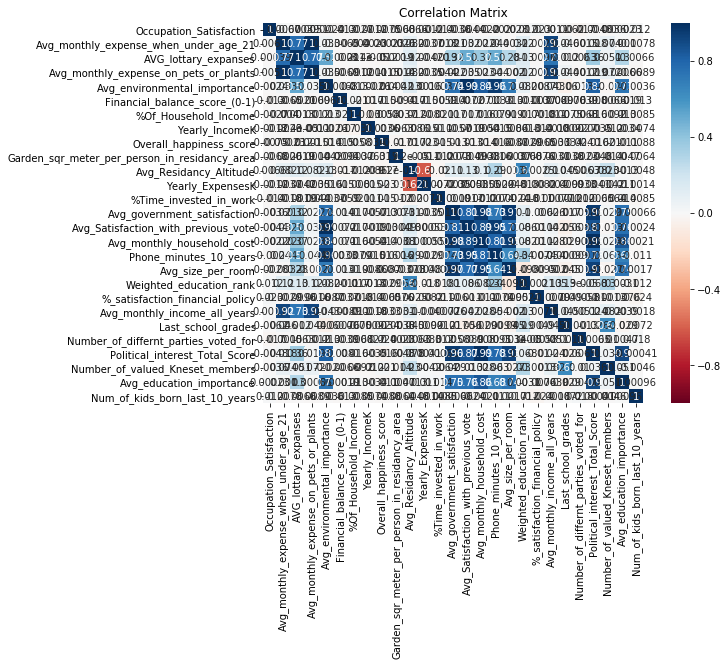

In [14]:
plt.subplots(figsize=(10,7))
corr_matrix = voters.corr()
corr = sns.heatmap(corr_matrix, square=True, annot=True, vmax=1.0, vmin=-1.0, cmap="RdBu").set_title('Correlation Matrix')
plt.yticks(rotation=0)
plt.xticks(rotation=90)


## <a name="data_visualization"></a>Data Visualization
In this section we will use matplotlib and seaborn packages to plot basic common plot while doing data analysis

Distribution plot for a numeric variable. Can see the right long tail for "price"

In [19]:
print("Mean Diamond Price = " + str(np.mean(voters.vote)))
print("Median Diamond Price = " + str(np.median(voters.vote)))
plt.subplots(figsize=(10,7))
sns.distplot(voters.Vote, label="Vote")

AttributeError: 'DataFrame' object has no attribute 'vote'

Distribution plot for a categorical variable

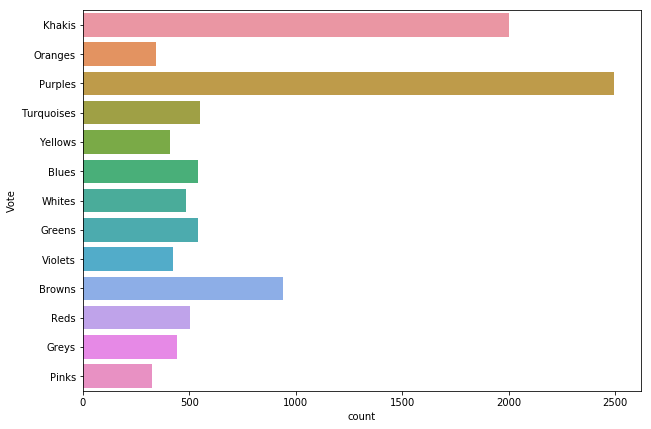

In [18]:
plt.subplots(figsize=(10,7))
sns.countplot(y = voters.Vote)

Analyzing a numeric variable distrbution per a categorical variable values using boxplots.

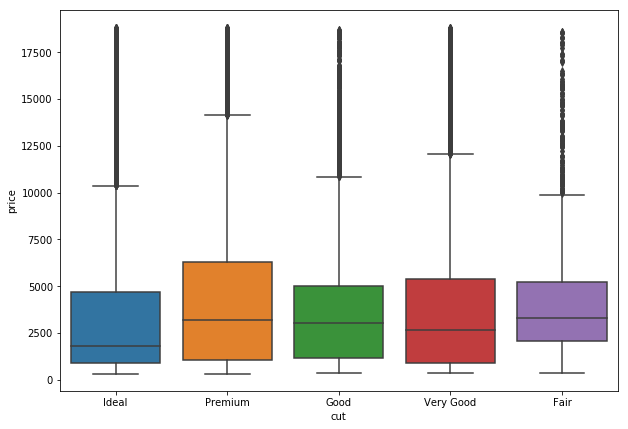

In [19]:
plt.subplots(figsize=(10,7))
sns.boxplot(x="cut", y="price", data=diamonds);

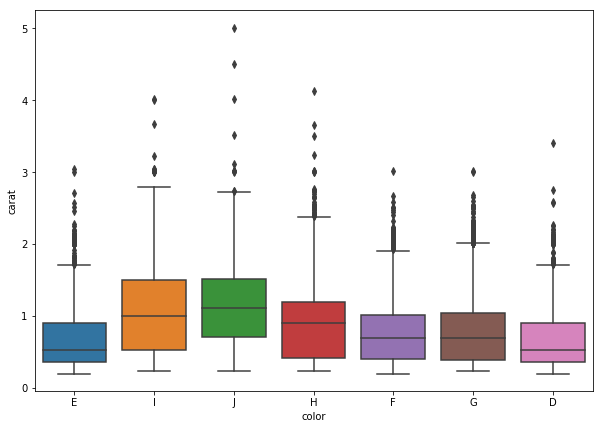

In [20]:
plt.subplots(figsize=(10,7))
sns.boxplot(x="color", y="carat", data=diamonds);

In [21]:
e_d = diamonds[diamonds.color == "I"]
np.median(e_d['price'])

3730.0

Analyzing a numeric variable distrbution per a categorical variable values using density plots.

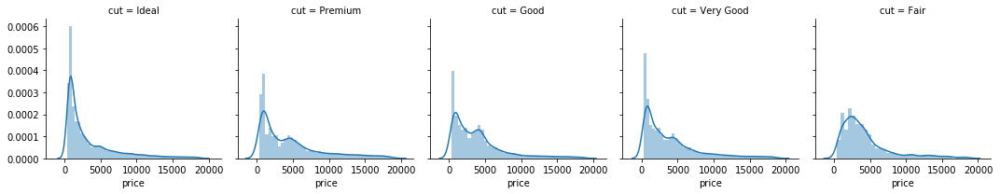

In [22]:
g=sns.FacetGrid(diamonds, col='cut')
g.map(sns.distplot, "price")

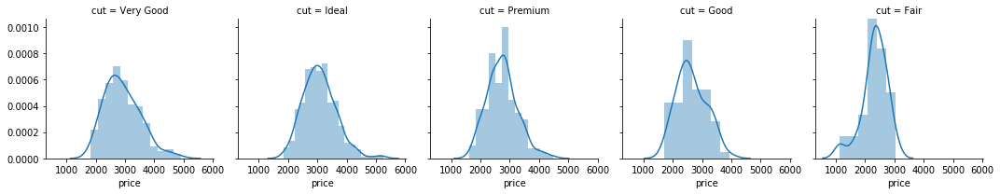

In [23]:
g=sns.FacetGrid(diamonds[(diamonds['carat'] < 0.8) & (diamonds['carat']>0.75)], col='cut')
g.map(sns.distplot, "price")

In [24]:
d = diamonds[(diamonds['carat'] < 0.8) & (diamonds['carat']>0.75)]
d.shape

(844, 10)

Analyzing two numeric variables. Plotting an advanced scatter plot

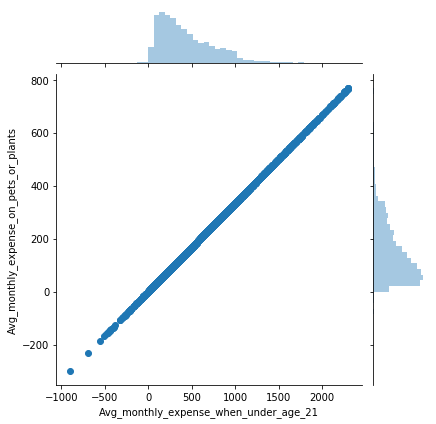

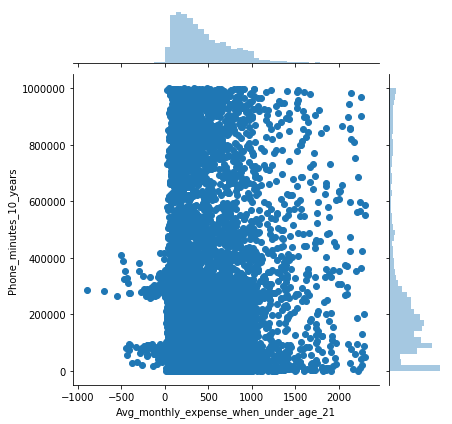

In [30]:
sns.jointplot(x="Avg_monthly_expense_when_under_age_21", y="Avg_monthly_expense_on_pets_or_plants", data=voters)
sns.jointplot(x="Avg_monthly_expense_when_under_age_21", y="Phone_minutes_10_years", data=voters)

#sns.jointplot(x="x", y="price", data=diamonds, kind="kde")

Analyze automatically all numerical variables pairwaise combinations

C:\Users\aavivi\AppData\Local\Continuum\anaconda2\envs\school\lib\site-packages\numpy\lib\histograms.py:824: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
C:\Users\aavivi\AppData\Local\Continuum\anaconda2\envs\school\lib\site-packages\numpy\lib\histograms.py:825: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


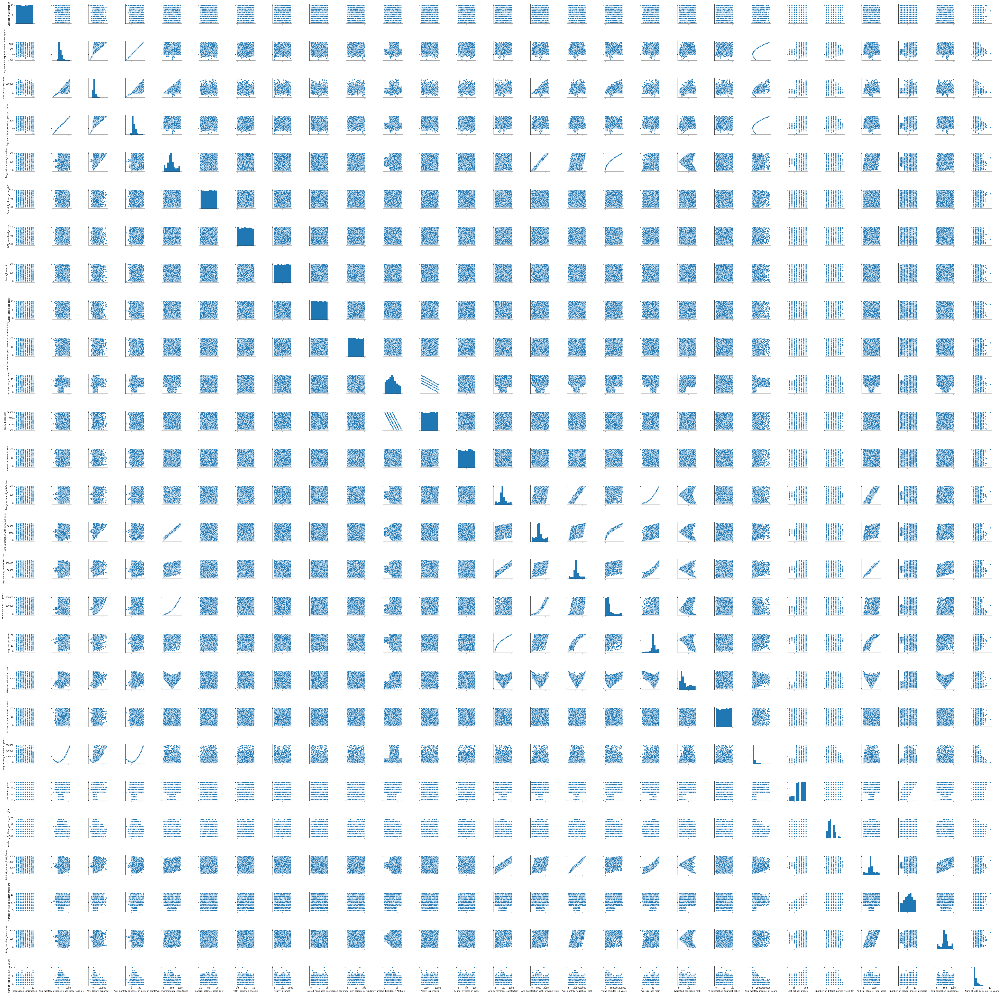

In [20]:
sns.pairplot(voters);